# Introduction to Data Science and Machine Learning

<p align="center">
    <img width="699" alt="image" src="https://user-images.githubusercontent.com/49638680/159042792-8510fbd1-c4ac-4a48-8320-bc6c1a49cdae.png">
</p>

---

### Import libraries


In [1]:
# Import libraries
import pandas as pd
import numpy as np
import copy

import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib import offsetbox
import seaborn as sns

from sklearn import datasets
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN, KMeans, SpectralClustering, MiniBatchKMeans
from sklearn.metrics import silhouette_samples, silhouette_score, accuracy_score, confusion_matrix
from sklearn.utils.multiclass import unique_labels


# set plot size
plt.rcParams['figure.figsize'] = (20, 13)
%matplotlib inline
%config InlineBackend.figure_format = "retina"

sns.set()

## Proposed Solutions

### Exercise 1

Apply silhouette analysis to [this dataset](https://raw.githubusercontent.com/andreduong-zz/credit-card-clustering/master/CC%20GENERAL.csv) and use your result to solve the following exercise.

> Develop a _customer segmentation_ to define marketing strategy. The sample Dataset summarises the usage behaviour of about $9000$ active credit card holders during the last $6$ months. The file is at a customer level with $18$ behavioural variables.


In [2]:
file = 'https://raw.githubusercontent.com/andreduong-zz/credit-card-clustering/master/CC%20GENERAL.csv'
df = pd.read_csv(file)

df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


#### Explorative data analysis

As usual, we play a bit with the dataset in order to extract useful information about the problem.

In [3]:
df.info(memory_usage="deep")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

We can see we have some missing value in `CREDIT_LIMIT` and `MINIMUM_PAYMENTS`.

As usual, there are several approaches one can adopt about missing data. 
In this case, we will fill the missing values the mean of the column. Specifically,

In [4]:
df.loc[(df["CREDIT_LIMIT"].isnull() == True), "CREDIT_LIMIT"] = df["CREDIT_LIMIT"].mean()
df.loc[(df["MINIMUM_PAYMENTS"].isnull() == True), "MINIMUM_PAYMENTS"] = df["MINIMUM_PAYMENTS"].mean()

##### Drop useless features

The dataset contains $17$ features. 
Now, we need to consider if all of them is necessary to train the model. 
In our case, `CUST_ID` is of no help. 
So we will drop it.

In [5]:
df.drop("CUST_ID", axis = 1, inplace = True)

##### Scaling features

Some features such as `PURCHASES` vary in a wide range, while other features such as `PURCHASES_FREQUENCY` vary between 0 to 1. 
Since k-means is an algorithm based on distances, we need to scale all features on the same range. 
Here we use `StandardScaler()` to remove mean and scale to unit variance.

In [6]:
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

X = df_scaled

#### Silhouette Analysis

Before applying the algorithm, we need to find the right number of $k$, _i.e._ the number of clusters.
We can determine such a number with the _Silhouette Analysis_.

For n_clusters = 2 The average silhouette_score is : 0.20984981580667525
For n_clusters = 3 The average silhouette_score is : 0.25111547580989396
For n_clusters = 4 The average silhouette_score is : 0.19760744927206977
For n_clusters = 5 The average silhouette_score is : 0.19336762540980337
For n_clusters = 6 The average silhouette_score is : 0.202755081788085
For n_clusters = 7 The average silhouette_score is : 0.21434094199507045
For n_clusters = 8 The average silhouette_score is : 0.21252194053506376
For n_clusters = 9 The average silhouette_score is : 0.22605897078937356
For n_clusters = 10 The average silhouette_score is : 0.22151295467802876
For n_clusters = 11 The average silhouette_score is : 0.21691146247570972
For n_clusters = 12 The average silhouette_score is : 0.2158474941330088
For n_clusters = 13 The average silhouette_score is : 0.22053522835997738
For n_clusters = 14 The average silhouette_score is : 0.19954829434395033
For n_clusters = 15 The average silhouette_score 

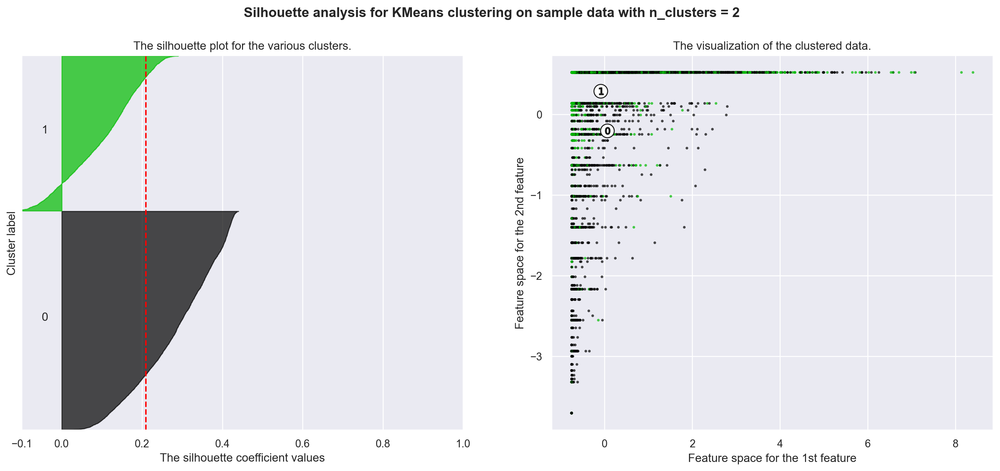

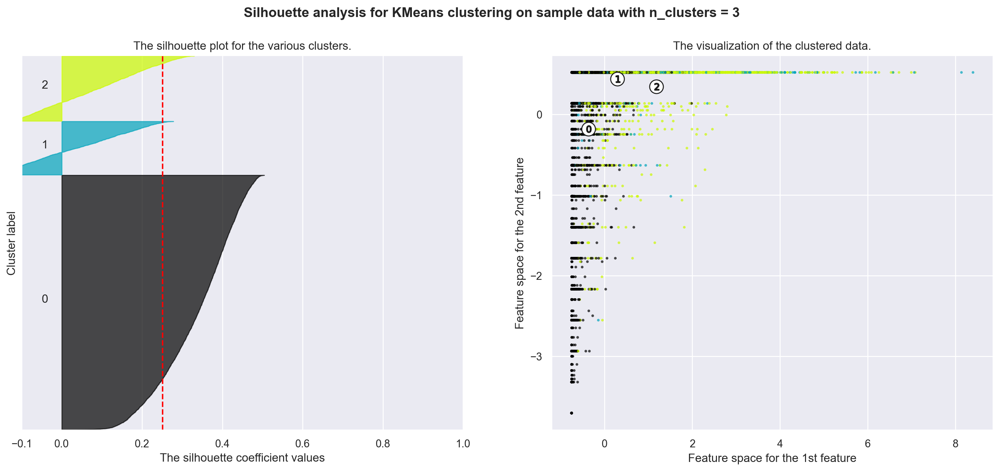

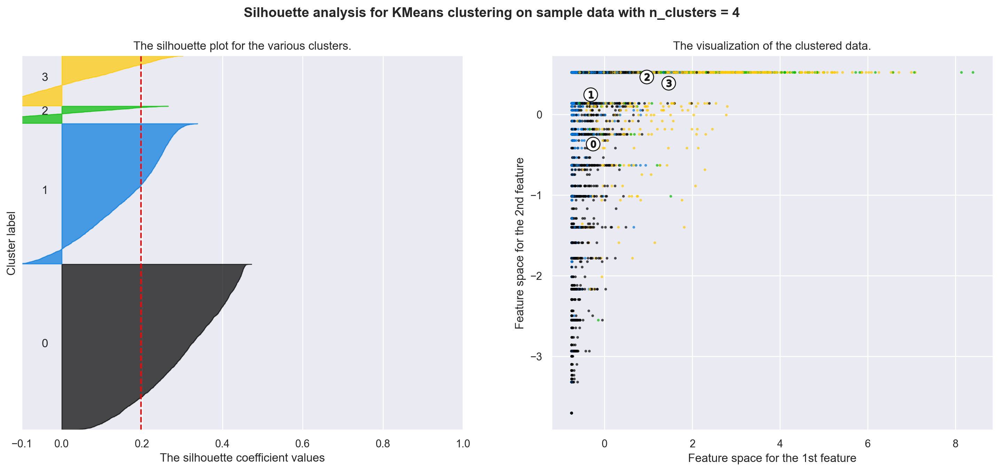

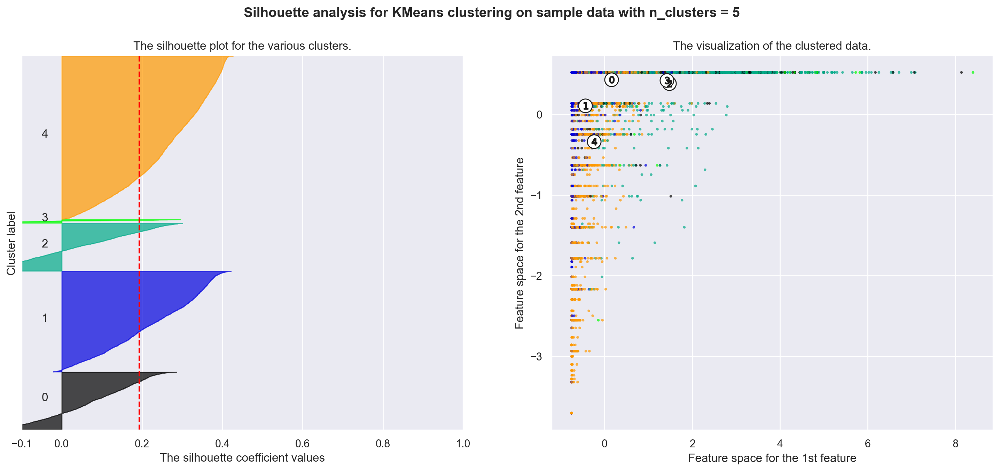

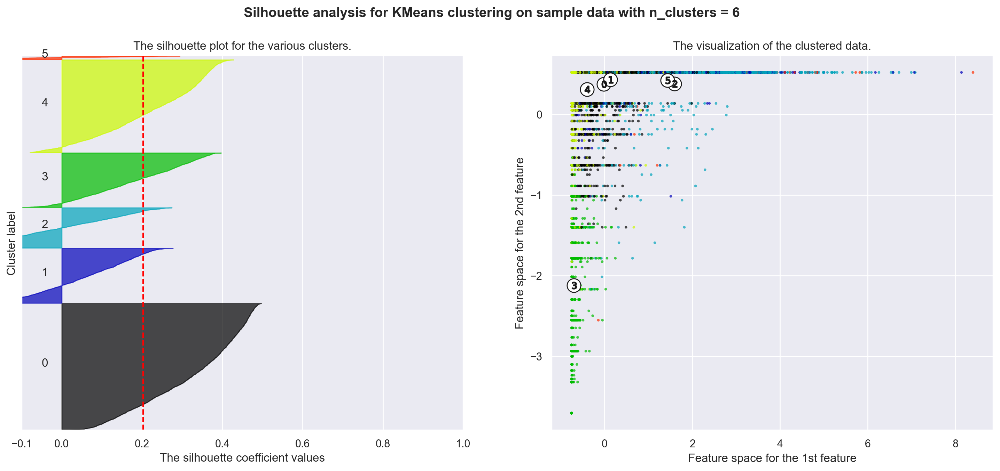

...

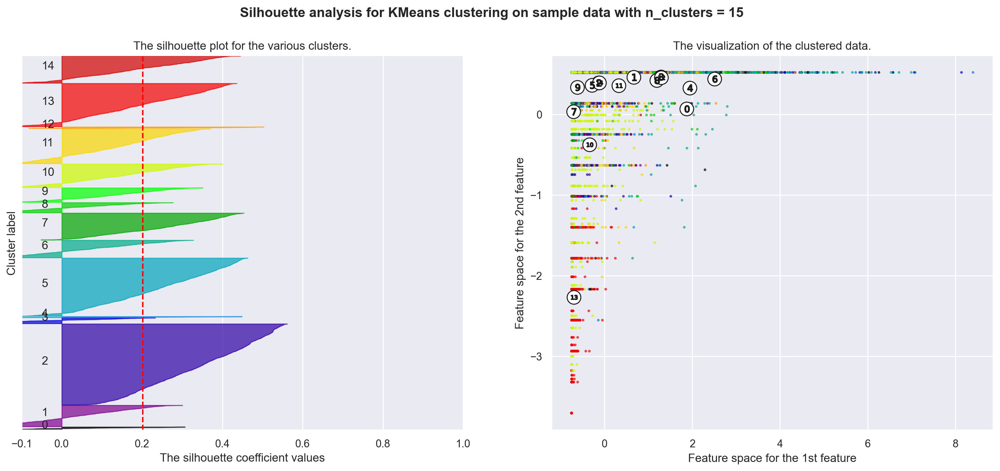

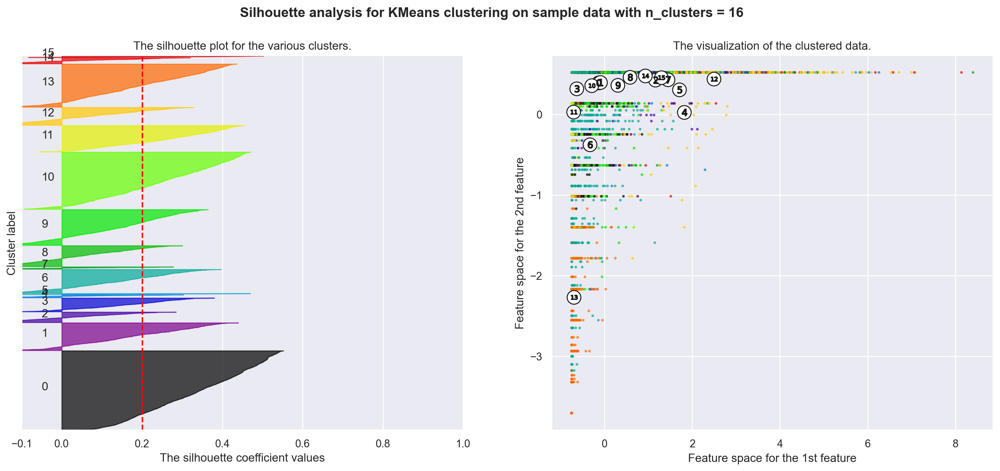

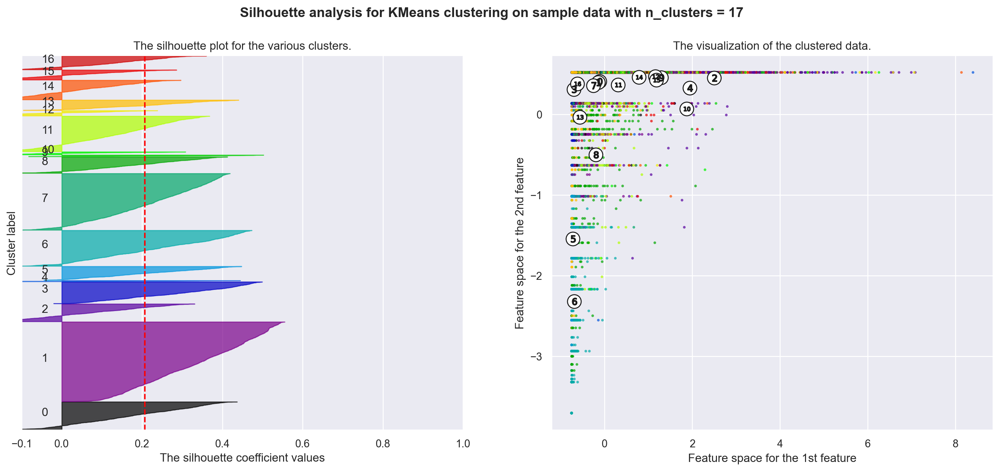

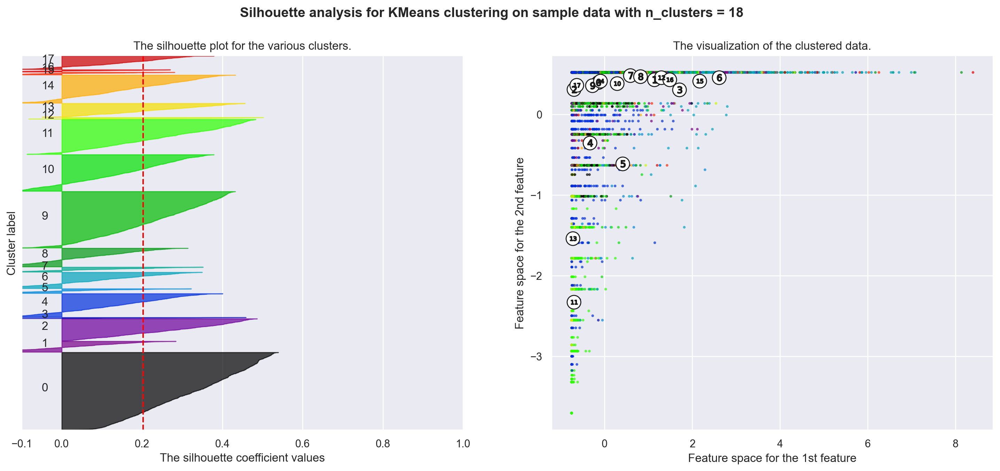

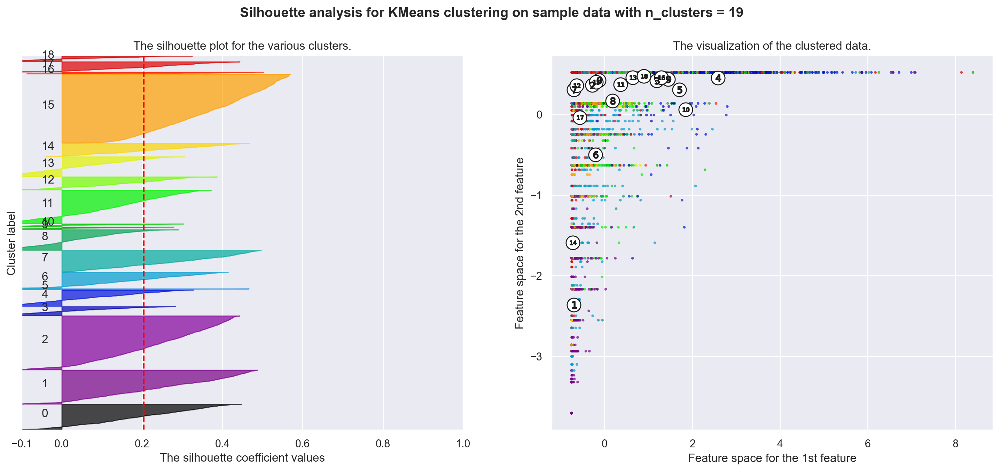

In [7]:
max_n_clusters = 20 # define the max value in the range of k's.

for n_clusters in range(2, max_n_clusters):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()


Silhouette score does not give a clear answer so we take the maximum number before it start decreasing (a sort of _elbow method_).

#### Apply the model

Chosen $k$, we need to apply the model.

In [8]:
kmeans = KMeans(n_clusters = 5, init = "k-means++", max_iter = 300, n_init = 10, random_state = 10)
labels = kmeans.fit_predict(X)

#### Visualise clusters

With the prediction results, the first visualization is to review the feature distribution for each cluster.

In [9]:
df["cluster"] = labels # add cluster infomration as a new column to the dataframe

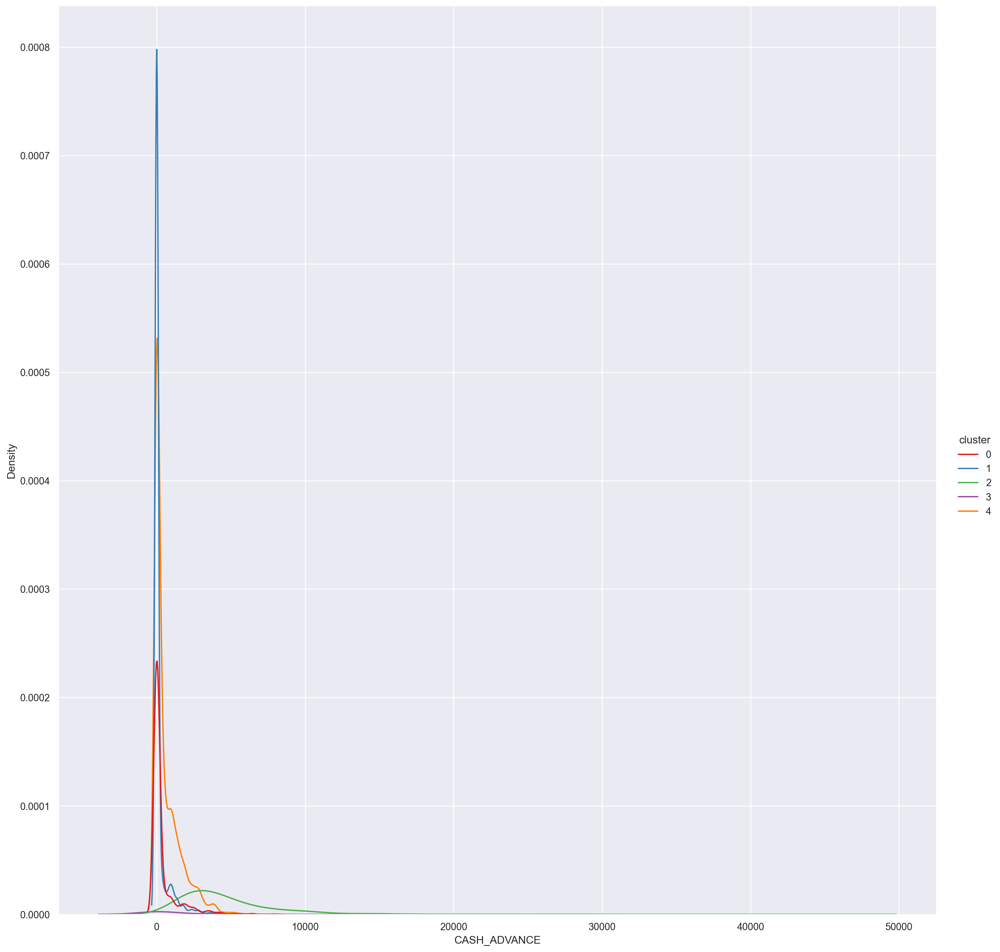

In [10]:
sns.displot(df, x="CASH_ADVANCE", hue = "cluster", palette = "Set1", kind="kde", height=15);

In [11]:
# A brief statistical report on the clusters
for cluster in range(kmeans.n_clusters):
    print("Cluster %d:" % cluster)
    print(df[df["cluster"] == cluster]["CASH_ADVANCE"].describe())
    print("\n")

Cluster 0:
count    1384.000000
mean      353.408743
std       870.455703
min         0.000000
25%         0.000000
50%         0.000000
75%       123.742116
max      7894.578816
Name: CASH_ADVANCE, dtype: float64


Cluster 1:
count    2414.000000
mean      178.096535
std       534.748139
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      5001.962631
Name: CASH_ADVANCE, dtype: float64


Cluster 2:
count     1143.000000
mean      4644.490824
std       3663.144922
min          0.000000
25%       2437.275883
50%       3771.115165
75%       5750.530903
max      47137.211760
Name: CASH_ADVANCE, dtype: float64


Cluster 3:
count       86.000000
mean      1060.190695
std       3191.679741
min          0.000000
25%          0.000000
50%          0.000000
75%        172.019759
max      19513.474830
Name: CASH_ADVANCE, dtype: float64


Cluster 4:
count    3923.000000
mean      622.488991
std       942.546607
min         0.000000
25%         0.000000
50% 

/Users/oscar/miniconda3/envs/lectures/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


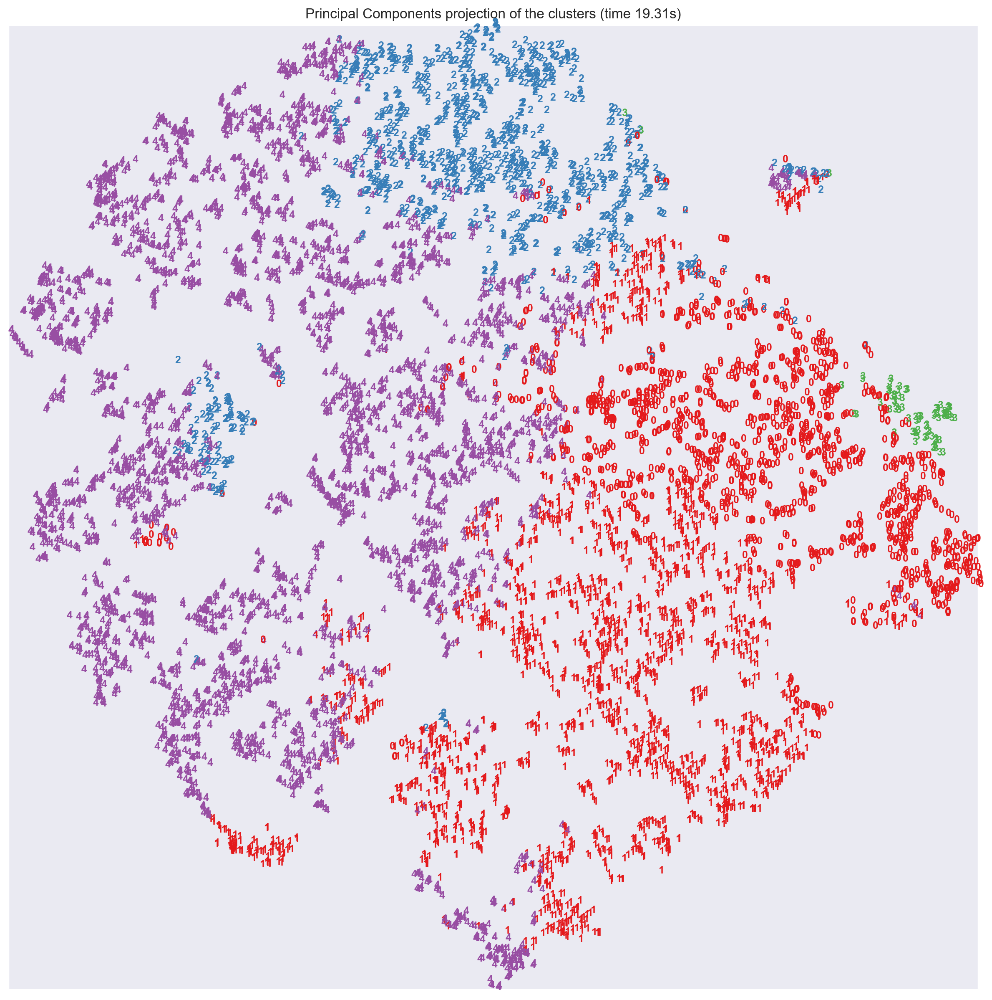

In [12]:
# Bonus: plot the clusters
from time import time
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

def plot_embedding(X, clusters, title=None):
    x_min, x_max = np.min(X, 0), np.max(X, 0)
    X = (X - x_min) / (x_max - x_min)
    y = np.array(clusters)

    plt.figure(figsize=(15,15))
    ax = plt.subplot(111)
    for i in range(X.shape[0]):
        plt.text(X[i, 0], X[i, 1], str(y[i]),
                 color=plt.cm.Set1(y[i] / 10.),
                 fontdict={'weight': 'bold', 'size': 9})

    if hasattr(offsetbox, 'AnnotationBbox'):
        # only print thumbnails with matplotlib > 1.0
        shown_images = np.array([[1., 1.]])  # just something big
        for i in range(X.shape[0]):
            dist = np.sum((X[i] - shown_images) ** 2, 1)
            if np.min(dist) < 4e-3:
                # don't show points that are too close
                continue
            shown_images = np.r_[shown_images, [X[i]]]
            
    plt.xticks([]), plt.yticks([])
    if title is not None:
        plt.title(title)

tsne = TSNE(n_components=2, init='pca', learning_rate='auto', random_state=0)
t0 = time()
X_tsne = tsne.fit_transform(X)
plot_embedding(X_tsne, labels,
               "Principal Components projection of the clusters (time %.2fs)" %
               (time() - t0))

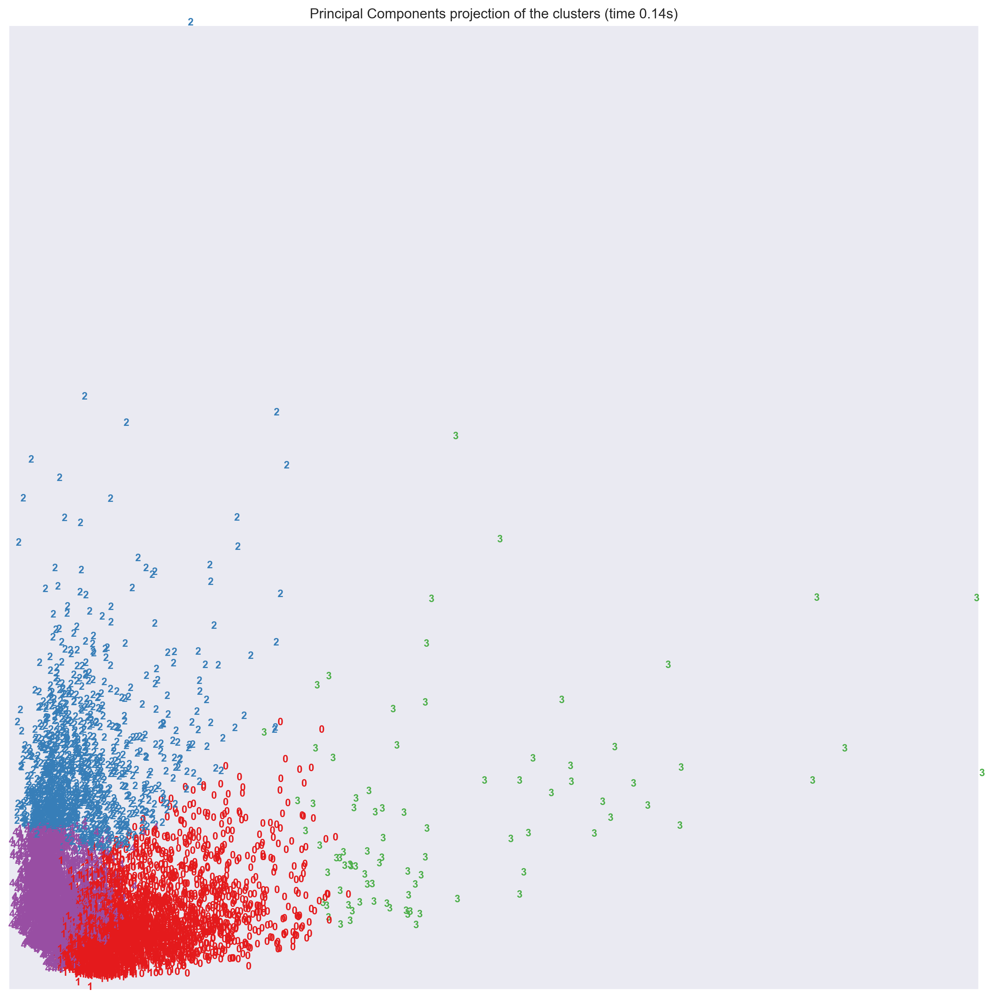

In [13]:
pca = PCA(n_components=2)
t0 = time()
X_pca = pca.fit_transform(X)
plot_embedding(X_pca, labels,
               "Principal Components projection of the clusters (time %.2fs)" %
               (time() - t0))

### Exercise 2

Try to apply $k$-means to digits dataset.

The aim of the exercise is to identify similar digits without using the original label information.
You can thin to this as similar to a first step in extracting meaning from a new dataset about which you do not have any _a priori_ label information.

Recall that the digits consist of $1797$ samples with $64$ features, where each of the $64$ features is the brightness of one pixel in an $8\times8$ image.

The result should be $10$ clusters in $64$ dimensions.
Notice that the cluster centroids themselves are $64$-dimensional points, and can themselves be interpreted as the "typical" digit within the cluster.

Write a code to plot what these cluster centers look like.

**Hint**: even if you are in an unsupervised context, you actually have labels, use theme to measure yur algorithm performance.

In [17]:
digits = datasets.load_digits() # load the digits dataset

X = digits.data # load the data into X
y = digits.target # load the labels into y

In [ ]:
kmeans = KMeans(n_clusters=10, random_state=42) # We already know the number of clusters
clusters = kmeans.fit_predict(digits.data)
res = kmeans.cluster_centers_.shape

print('Your result matrix collecting centroids has dimension:', res)
print('If everything is done correctly you should have obtained 10 clusters in 64 dimensions.')

Your result matrix collecting centroids has dimension: (10, 64)
If everything is done correctly you should have obtained 10 clusters in 64 dimensions.


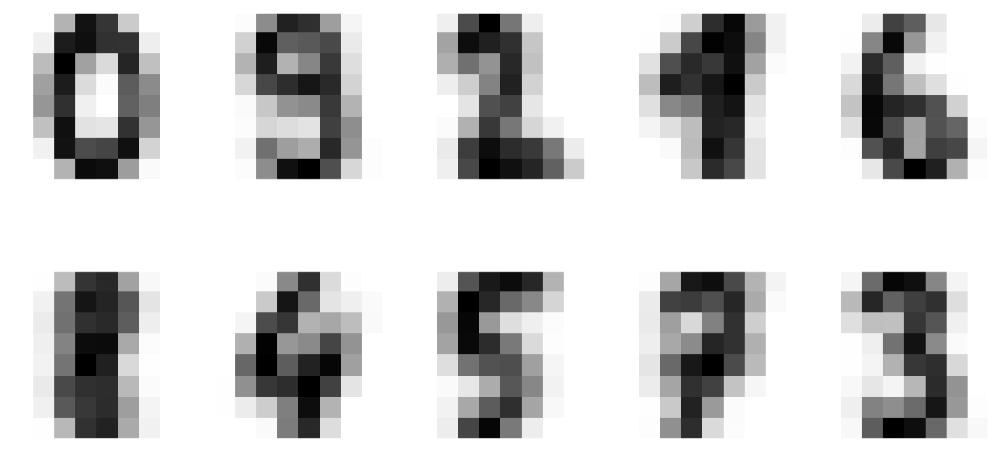

In [ ]:
# A code to show how these cluster centroids look like
fig, ax = plt.subplots(2, 5, figsize=(10, 5))
centers = kmeans.cluster_centers_.reshape(10, 8, 8)
for axi, center in zip(ax.flat, centers):
    axi.set(xticks=[], yticks=[])
    axi.imshow(center, interpolation='nearest', cmap=plt.cm.binary)

In [ ]:
# Bonus 1: calculate accuracy of the clusters
from scipy.stats import mode

# This is useful to check how accurate our unsupervised clustering was in finding similar digits within the data.
labels = np.zeros_like(clusters)
for i in range(10):
    mask = (clusters == i)
    labels[mask] = mode(digits.target[mask])[0]

acc = accuracy_score(digits.target, labels)

print('Your algorithm accuracy %.2f%%'%(acc*100) )
print('The accuracy should be ~80%' )

Your algorithm accuracy 79.02%
The accuracy should be ~80%


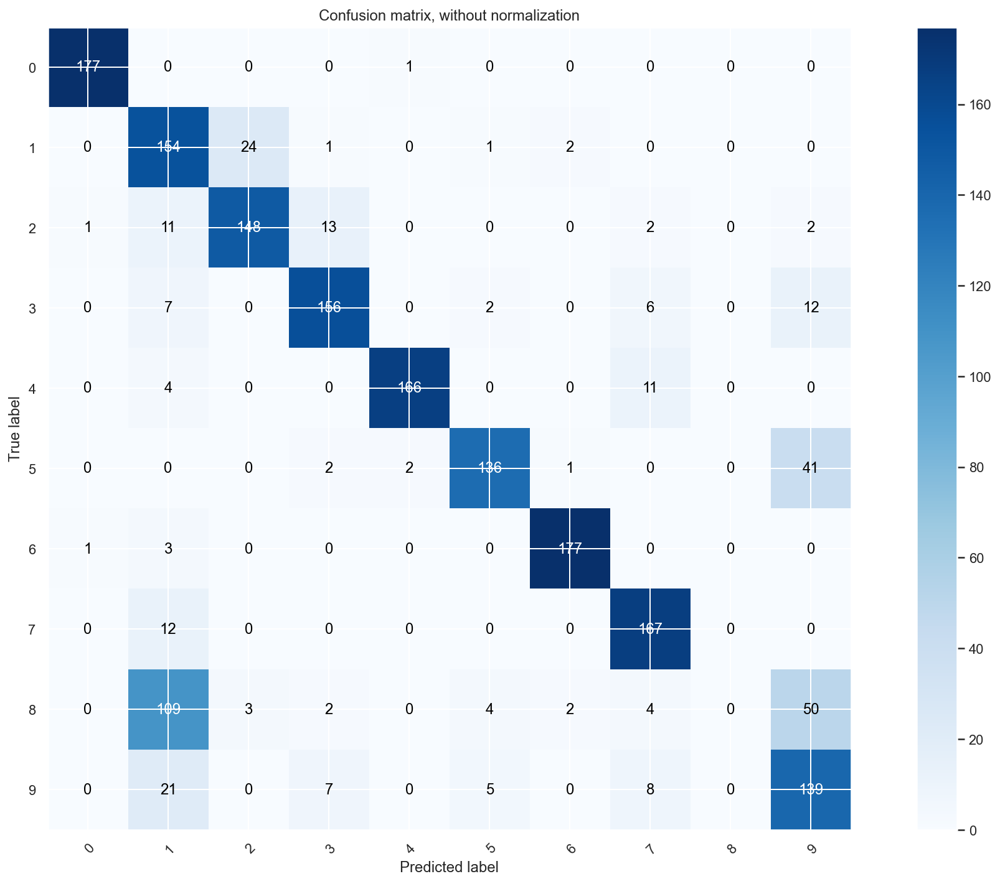

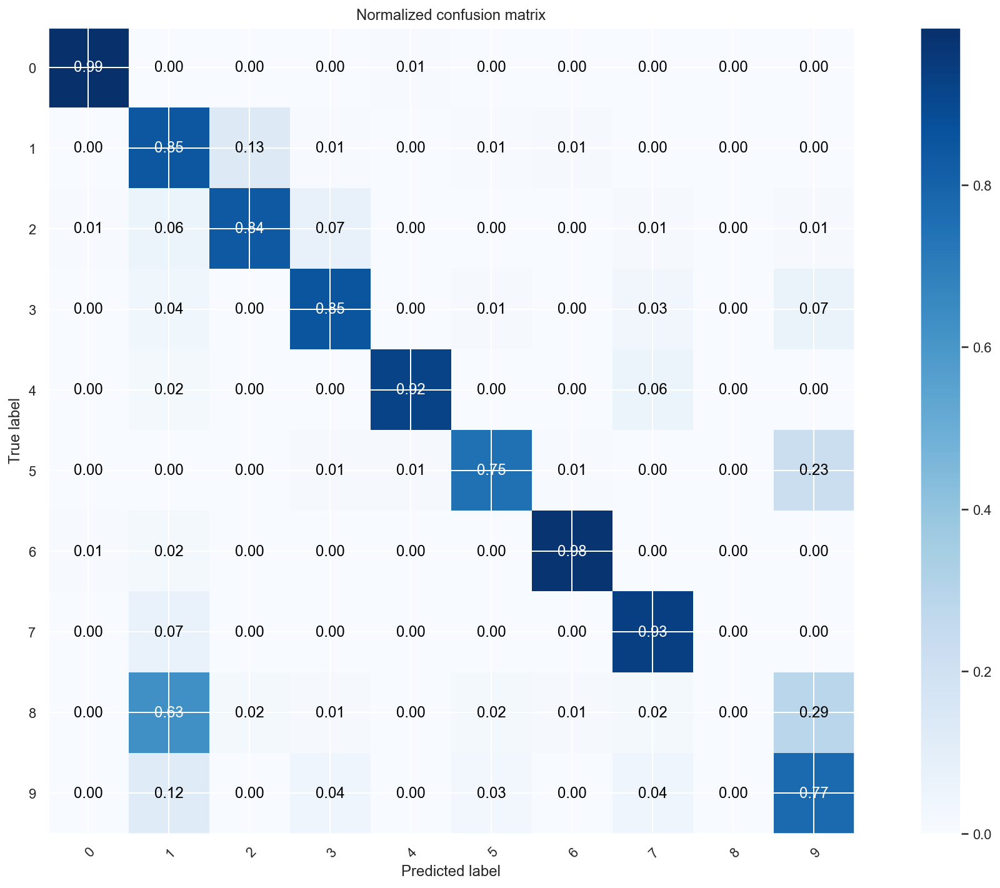

In [ ]:
# Bonus 2: plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.rcParams["figure.figsize"] = (15,10) # Change the default figure size
    
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        
    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plot_confusion_matrix(digits.target, labels, classes=digits.target_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plot_confusion_matrix(digits.target, labels, classes=digits.target_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

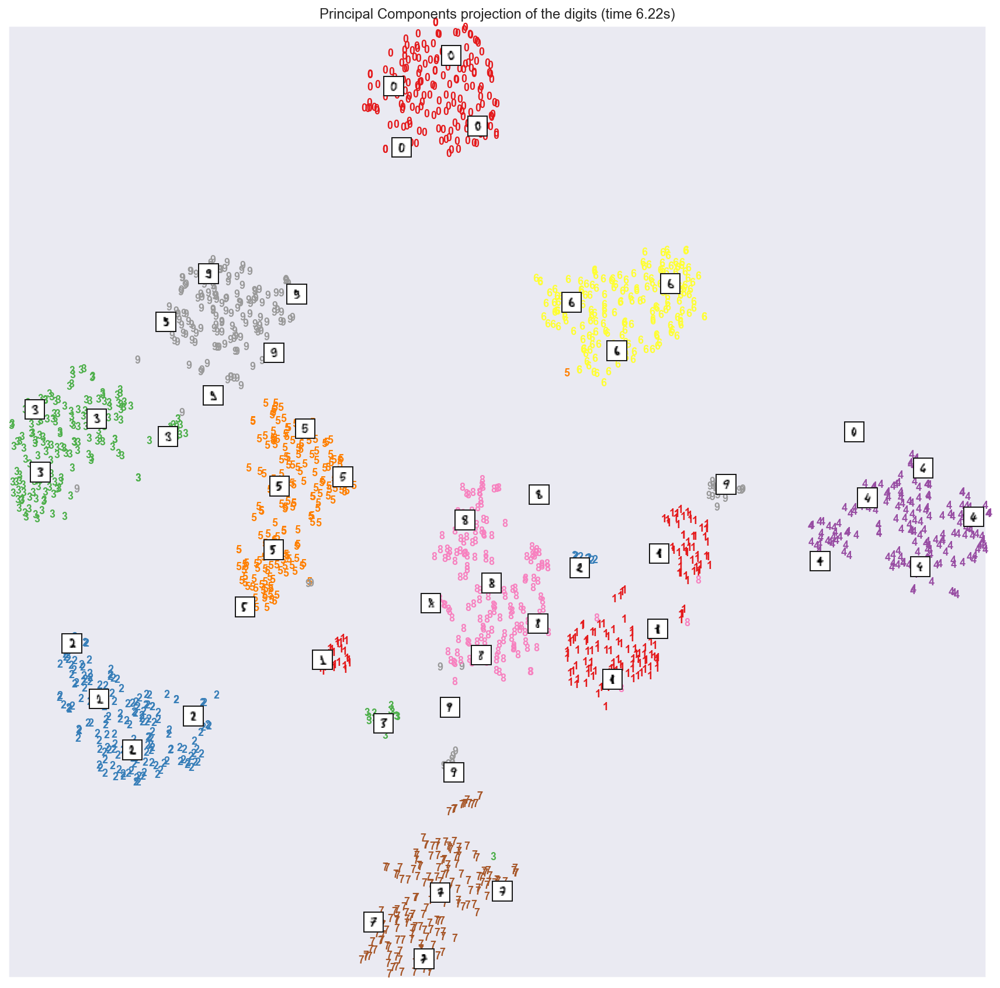

In [ ]:
# Bonus 3: plot the clusters
from time import time
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

def plot_embedding(X, title=None):
    x_min, x_max = np.min(X, 0), np.max(X, 0)
    X = (X - x_min) / (x_max - x_min)

    plt.figure(figsize=(15,15))
    ax = plt.subplot(111)
    for i in range(X.shape[0]):
        plt.text(X[i, 0], X[i, 1], str(y[i]),
                 color=plt.cm.Set1(y[i] / 10.),
                 fontdict={'weight': 'bold', 'size': 9})

    if hasattr(offsetbox, 'AnnotationBbox'):
        # only print thumbnails with matplotlib > 1.0
        shown_images = np.array([[1., 1.]])  # just something big
        for i in range(X.shape[0]):
            dist = np.sum((X[i] - shown_images) ** 2, 1)
            if np.min(dist) < 4e-3:
                # don't show points that are too close
                continue
            shown_images = np.r_[shown_images, [X[i]]]
            imagebox = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(digits.images[i], cmap=plt.cm.gray_r),
                X[i])
            ax.add_artist(imagebox)
    plt.xticks([]), plt.yticks([])
    if title is not None:
        plt.title(title)

tsne = TSNE(n_components=2, init='pca', random_state=0)
t0 = time()
X_tsne = tsne.fit_transform(X)
plot_embedding(X_tsne,
               "Principal Components projection of the digits (time %.2fs)" %
               (time() - t0))


### Exercise 3

Use the [Mall Customer dataset](https://www.kaggle.com/vjchoudhary7/customer-segmentation-tutorial-in-python) and cluster them in spending groups, that is groups with somehow homogeneous _spending scores_.

The exercise should contain $5$ steps:

1. Problem statement
2. Data Analysis
3. Data processing
4. The clustering algorithm and related choices
   - Clustering plots
5. Takeaways

**BONUS**: An appropriate EDA and nice data visualisation.


In [2]:
df = pd.read_csv("datasets/Mall_Customers.csv")

df.head()

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40


In [3]:
df.info(memory_usage="deep")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   CustomerID              200 non-null    int64 
 1   Gender                  200 non-null    object
 2   Age                     200 non-null    int64 
 3   Annual Income (k$)      200 non-null    int64 
 4   Spending Score (1-100)  200 non-null    int64 
dtypes: int64(4), object(1)
memory usage: 18.5 KB


In [4]:
df.describe()

,CustomerID,Age,Annual Income (k$),Spending Score (1-100)
count,200.000000,200.000000,200.000000,200.000000
mean,100.500000,38.850000,60.560000,50.200000
std,57.879185,13.969007,26.264721,25.823522
min,1.000000,18.000000,15.000000,1.000000
25%,50.750000,28.750000,41.500000,34.750000
50%,100.500000,36.000000,61.500000,50.000000
75%,150.250000,49.000000,78.000000,73.000000
max,200.000000,70.000000,137.000000,99.000000


We drop the id column, which is not relevant and we plot the age distribution of customers.

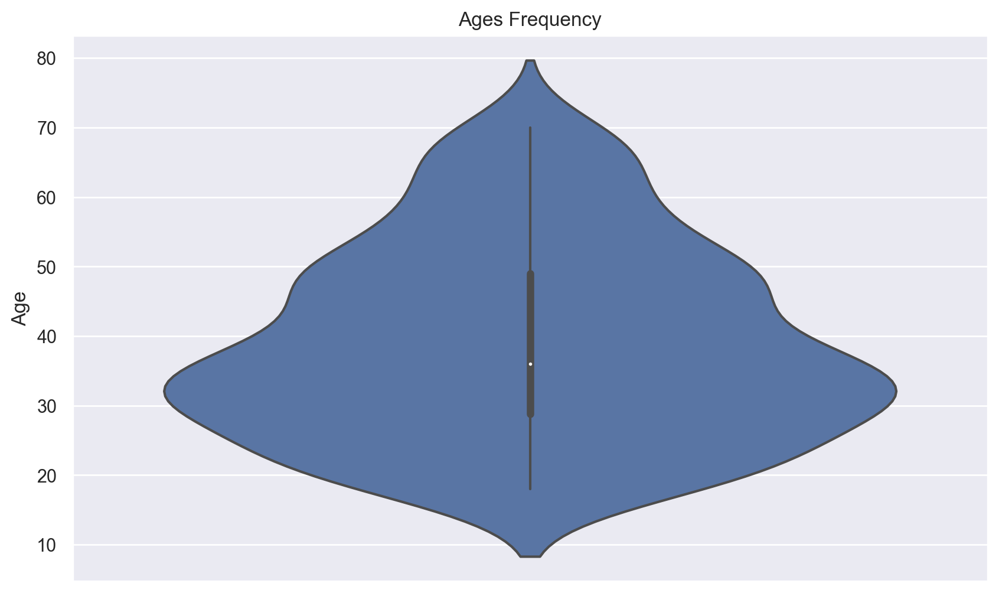

In [5]:
df.drop(["CustomerID"], axis = 1, inplace=True)

plt.figure(figsize=(10,6))
plt.title("Ages Frequency")
sns.axes_style("dark")
sns.violinplot(y=df["Age"])
plt.show()

Next we make a box plot of spending score and annual income to better visualise the distribution range. 
The range of spending score is clearly more than the annual income range as one can see from the describe table as well.

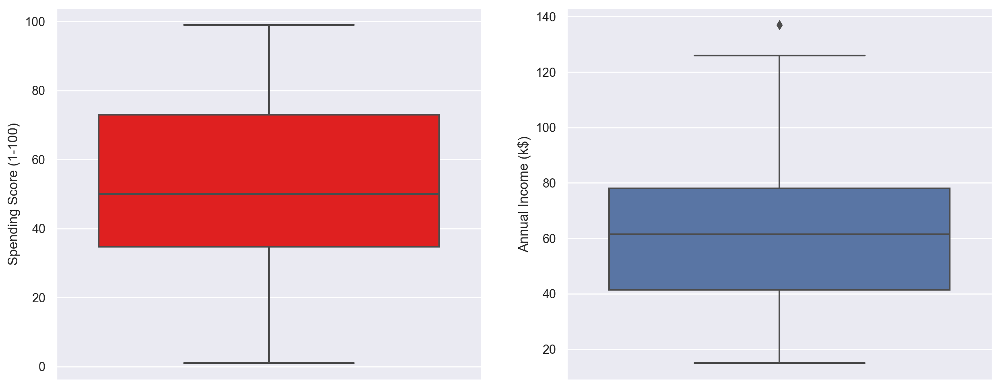

In [6]:
plt.figure(figsize=(15,6))
plt.subplot(1,2,1)
sns.boxplot(y=df["Spending Score (1-100)"], color="red")
plt.subplot(1,2,2)
sns.boxplot(y=df["Annual Income (k$)"])
plt.show()

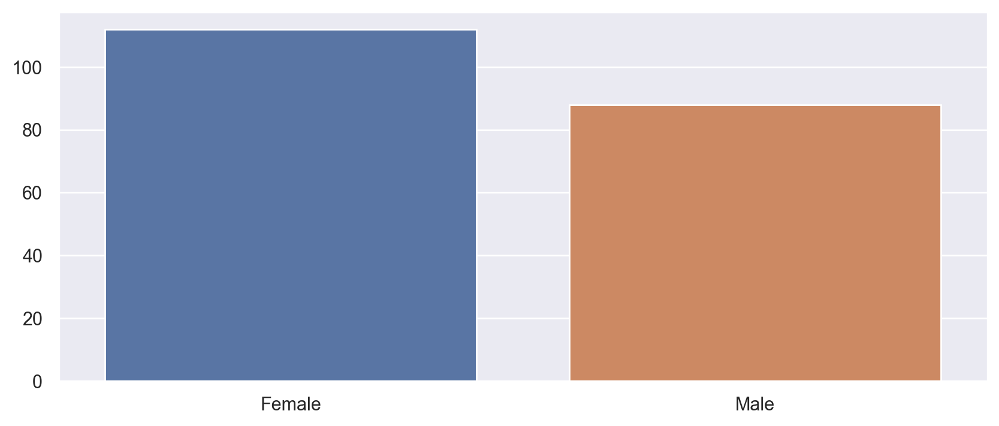

In [7]:
# Gender distribution of the dataset
genders = df.Gender.value_counts()
sns.set_style("darkgrid")
plt.figure(figsize=(10,4))
sns.barplot(x=genders.index, y=genders.values)
plt.show()

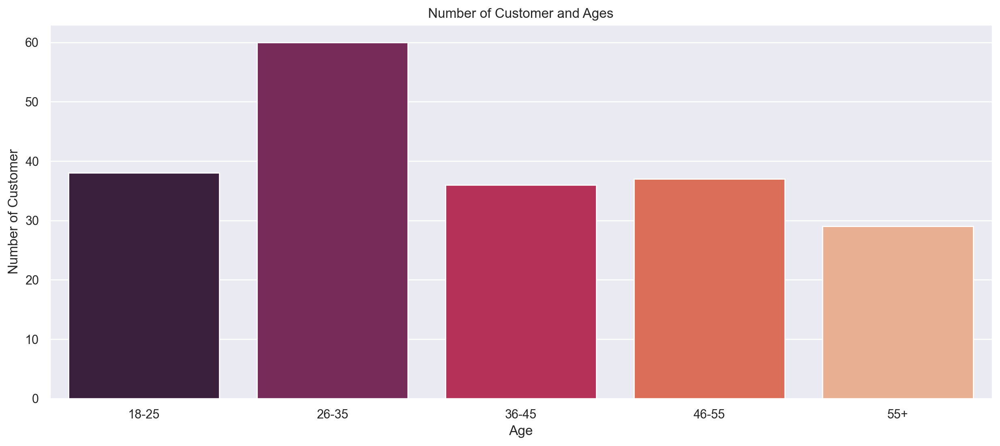

In [8]:
# Age distribution of customers
age18_25 = df.Age[(df.Age <= 25) & (df.Age >= 18)]
age26_35 = df.Age[(df.Age <= 35) & (df.Age >= 26)]
age36_45 = df.Age[(df.Age <= 45) & (df.Age >= 36)]
age46_55 = df.Age[(df.Age <= 55) & (df.Age >= 46)]
age55above = df.Age[df.Age >= 56]

x = ["18-25","26-35","36-45","46-55","55+"]
y = [len(age18_25.values),len(age26_35.values),len(age36_45.values),len(age46_55.values),len(age55above.values)]

plt.figure(figsize=(15,6))
sns.barplot(x=x, y=y, palette="rocket")
plt.title("Number of Customer and Ages")
plt.xlabel("Age")
plt.ylabel("Number of Customer")
plt.show()

Furthermore, we produce a bar plot to visualise the number of customers according to their spending scores.
The majority of the customers have spending score in the range 41–60.



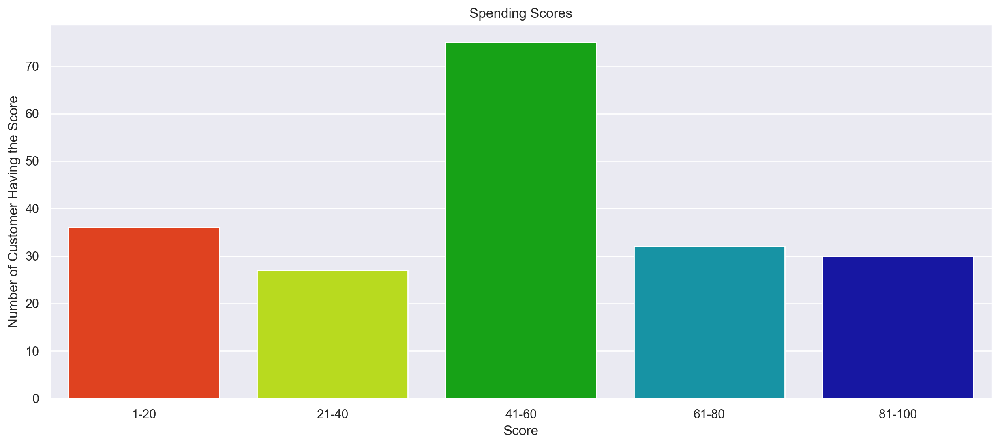

In [9]:
ss1_20 = df["Spending Score (1-100)"][(df["Spending Score (1-100)"] >= 1) & (df["Spending Score (1-100)"] <= 20)]
ss21_40 = df["Spending Score (1-100)"][(df["Spending Score (1-100)"] >= 21) & (df["Spending Score (1-100)"] <= 40)]
ss41_60 = df["Spending Score (1-100)"][(df["Spending Score (1-100)"] >= 41) & (df["Spending Score (1-100)"] <= 60)]
ss61_80 = df["Spending Score (1-100)"][(df["Spending Score (1-100)"] >= 61) & (df["Spending Score (1-100)"] <= 80)]
ss81_100 = df["Spending Score (1-100)"][(df["Spending Score (1-100)"] >= 81) & (df["Spending Score (1-100)"] <= 100)]

ssx = ["1-20", "21-40", "41-60", "61-80", "81-100"]
ssy = [len(ss1_20.values), len(ss21_40.values), len(ss41_60.values), len(ss61_80.values), len(ss81_100.values)]

plt.figure(figsize=(15,6))
sns.barplot(x=ssx, y=ssy, palette="nipy_spectral_r")
plt.title("Spending Scores")
plt.xlabel("Score")
plt.ylabel("Number of Customer Having the Score")
plt.show()


Finally, a bar plot to visualise the number of customers according to their annual income. 
The majority of the customers have annual income in the range 60000 and 90000.



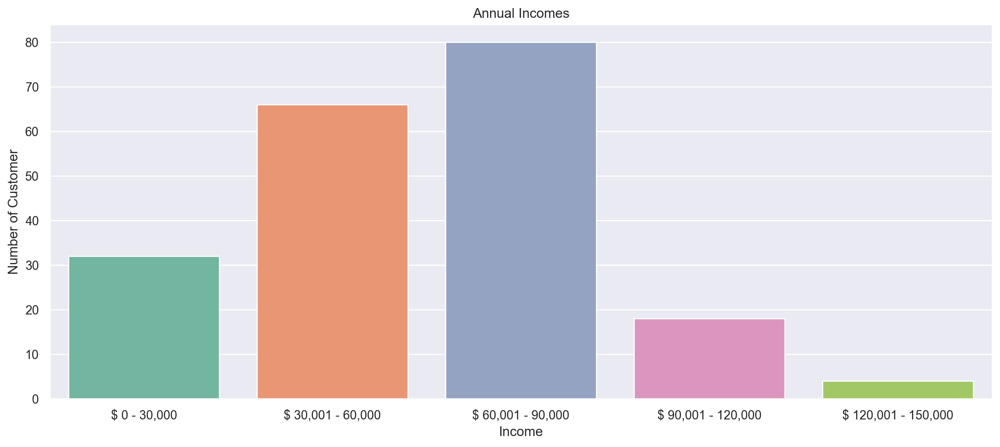

In [10]:
ai0_30 = df["Annual Income (k$)"][(df["Annual Income (k$)"] >= 0) & (df["Annual Income (k$)"] <= 30)]
ai31_60 = df["Annual Income (k$)"][(df["Annual Income (k$)"] >= 31) & (df["Annual Income (k$)"] <= 60)]
ai61_90 = df["Annual Income (k$)"][(df["Annual Income (k$)"] >= 61) & (df["Annual Income (k$)"] <= 90)]
ai91_120 = df["Annual Income (k$)"][(df["Annual Income (k$)"] >= 91) & (df["Annual Income (k$)"] <= 120)]
ai121_150 = df["Annual Income (k$)"][(df["Annual Income (k$)"] >= 121) & (df["Annual Income (k$)"] <= 150)]

aix = ["$ 0 - 30,000", "$ 30,001 - 60,000", "$ 60,001 - 90,000", "$ 90,001 - 120,000", "$ 120,001 - 150,000"]
aiy = [len(ai0_30.values), len(ai31_60.values), len(ai61_90.values), len(ai91_120.values), len(ai121_150.values)]

plt.figure(figsize=(15,6))
sns.barplot(x=aix, y=aiy, palette="Set2")
plt.title("Annual Incomes")
plt.xlabel("Income")
plt.ylabel("Number of Customer")
plt.show()

Let's use _elbow method_ to choose the number of clusters.

#### Inertia
The _Inertia_ or within cluster of sum of squares value gives an indication of how coherent the different clusters are. 
It is the sum of squared distance between points and centroids.

Formally,
$$ \mathcal{I} := \sum (x_i - \mu_k)^2\, . $$

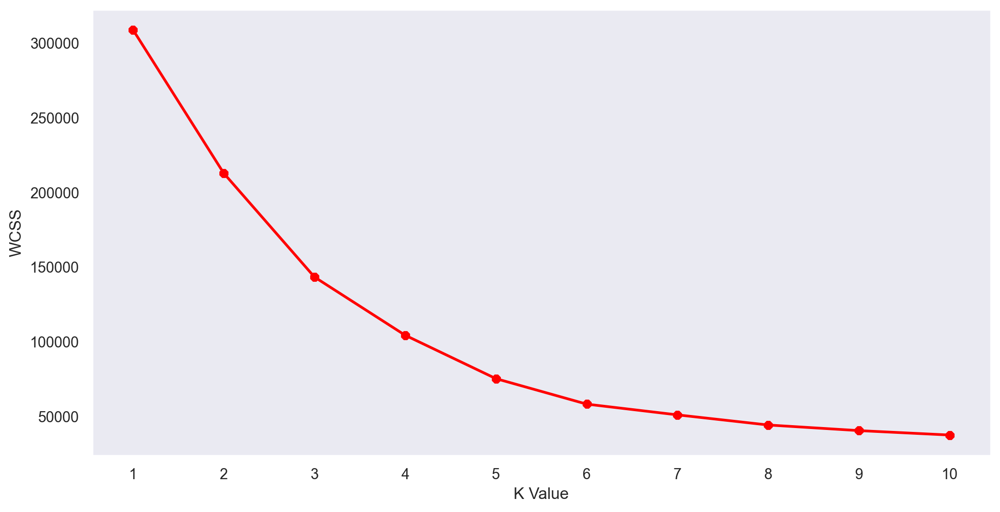

In [11]:
wcss = []
for k in range(1,11):
    kmeans = KMeans(n_clusters=k, init="k-means++")
    kmeans.fit(df.iloc[:,1:])
    wcss.append(kmeans.inertia_)
plt.figure(figsize=(12,6))    
plt.grid()
plt.plot(range(1,11),wcss, linewidth=2, color="red", marker ="8")
plt.xlabel("K Value")
plt.xticks(np.arange(1,11,1))
plt.ylabel("WCSS")
plt.show()

Using elbow method, we say that the best value for $k$ is between $4$ and $5$.

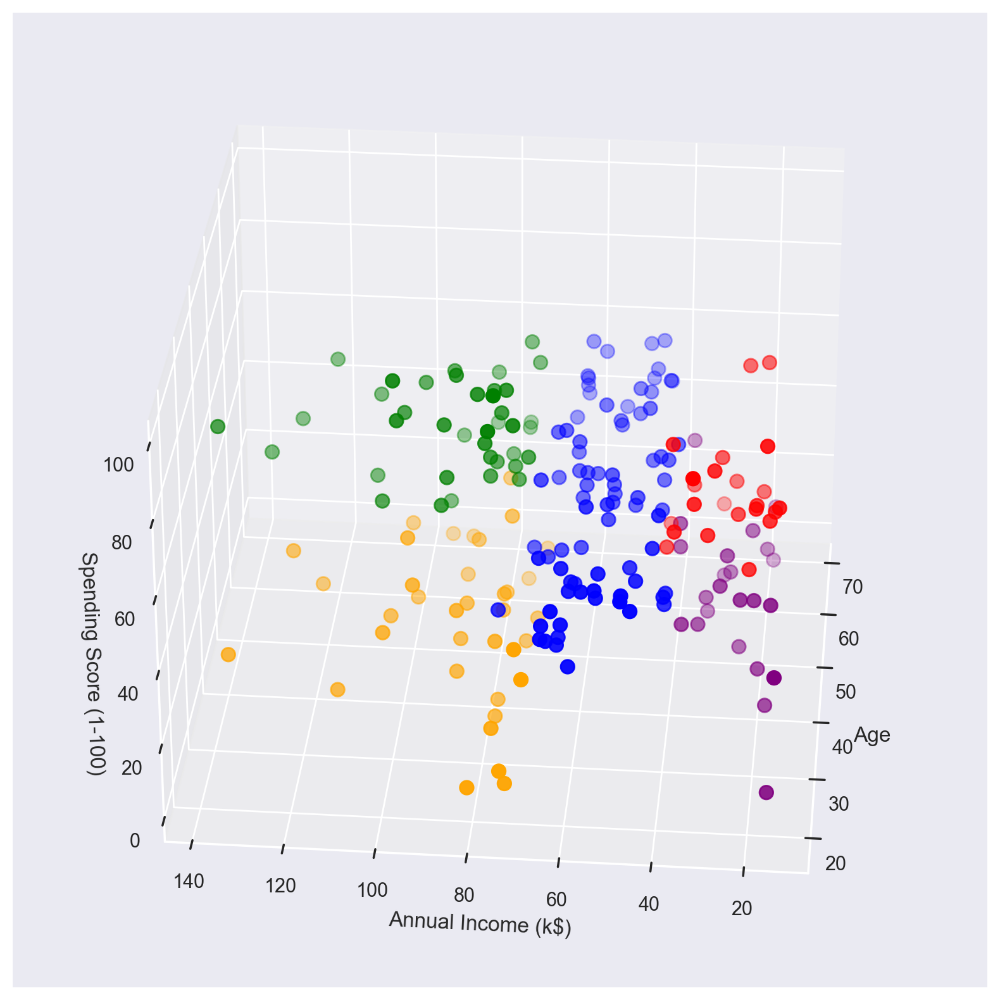

In [12]:
km = KMeans(n_clusters=5)
clusters = km.fit_predict(df.iloc[:,1:])
df["label"] = clusters

from mpl_toolkits.mplot3d import Axes3D
 
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df.Age[df.label == 0], df["Annual Income (k$)"][df.label == 0], df["Spending Score (1-100)"][df.label == 0], c='blue', s=60)
ax.scatter(df.Age[df.label == 1], df["Annual Income (k$)"][df.label == 1], df["Spending Score (1-100)"][df.label == 1], c='red', s=60)
ax.scatter(df.Age[df.label == 2], df["Annual Income (k$)"][df.label == 2], df["Spending Score (1-100)"][df.label == 2], c='green', s=60)
ax.scatter(df.Age[df.label == 3], df["Annual Income (k$)"][df.label == 3], df["Spending Score (1-100)"][df.label == 3], c='orange', s=60)
ax.scatter(df.Age[df.label == 4], df["Annual Income (k$)"][df.label == 4], df["Spending Score (1-100)"][df.label == 4], c='purple', s=60)
ax.view_init(30, 185)
plt.xlabel("Age")
plt.ylabel("Annual Income (k$)")
ax.set_zlabel('Spending Score (1-100)')
plt.show()

In [16]:
for k in range(5):
    print(df[df.label == k].describe())
    print("+"*20)

             Age  Annual Income (k$)  Spending Score (1-100)  label
count  79.000000           79.000000               79.000000   79.0
mean   43.088608           55.291139               49.569620    0.0
std    16.478572            8.710665                6.242295    0.0
min    18.000000           40.000000               35.000000    0.0
25%    27.000000           48.000000               44.500000    0.0
50%    47.000000           54.000000               50.000000    0.0
75%    54.500000           62.000000               55.000000    0.0
max    70.000000           76.000000               60.000000    0.0
++++++++++++++++++++
             Age  Annual Income (k$)  Spending Score (1-100)  label
count  23.000000           23.000000               23.000000   23.0
mean   25.521739           26.304348               78.565217    1.0
std     5.273170            7.893811               10.953729    0.0
min    18.000000           15.000000               61.000000    1.0
25%    21.500000           